# Neural style transfer. 
  
Rules of the task:
* no late submissions allowed 
* your ipynb file should be openable in Anytask directly (no external links, zip archives, etc.)
* your whole solution will not be graded
    * if github blocks of code are detected (except depth estimation network)
    * if equivalent blocks of code for several students are found (except depth estimation network)

Task consists of the following parts:
* part1 (7 points, if good visualization in part 3): program & train transformer network for fast style transfer [Johnson et al. 2016](https://arxiv.org/pdf/1603.08155.pdf) with minor changes for better performance:
    * replace batch normalization with instance normalization (don't forget that it should use **tunable** coefficients)
    * replace transposed convolutions with scaling and ordinary convolution
* part2 (5 points, if good visualization in part 3): augment it with depth loss like in [Liu et al. 2017](https://users.cs.cf.ac.uk/Yukun.Lai/papers/depth_style_transfer.pdf)
    * you may use any existing pytorch monocular depth estimation network from github and train it until convergence or use pretrained weights (give link to materials you used)
* part 3: visualization of the results (most important, it would show how well you made your models)
    * You should stylize **all** content images from images/contents using **any single style** from images/styles that you like more. So train your model in parts 1,2 to reproduce that particular style.
* optional part: any your ideas about style transfer improvement

In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
from collections import namedtuple

import torch
import torch.nn as nn
from torchvision import models
import torch.optim as optim
from torch.optim import Adam , Adadelta
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms

from PIL import Image
import argparse
import os
import sys
import time
from datetime import datetime
import re
from IPython import display
import numpy as np
from pdb import set_trace as bp
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [0]:
content_path ='/content/gdrive/My Drive/style_transfer/images/contents/v.jpg'
style_path ='/content/gdrive/My Drive/style_transfer/images/styles/aqua.png'
train_path ='/content/gdrive/My Drive/style_transfer/train' # /val2017/000000000139.jpg'
save_path ='/content/gdrive/My Drive/style_transfer/save'
checkpoint ='/content/gdrive/My Drive/style_transfer/checkpoint'

In [0]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.mul(255))
])

In [0]:
# из прошлой лабы тут нельзя менять t1 & t2 местами это важно!!
def input_transform(img):
  t1 = torchvision.transforms.ToTensor()
  t2 = torchvision.transforms.Resize((256,256))
  return t1(t2(img))

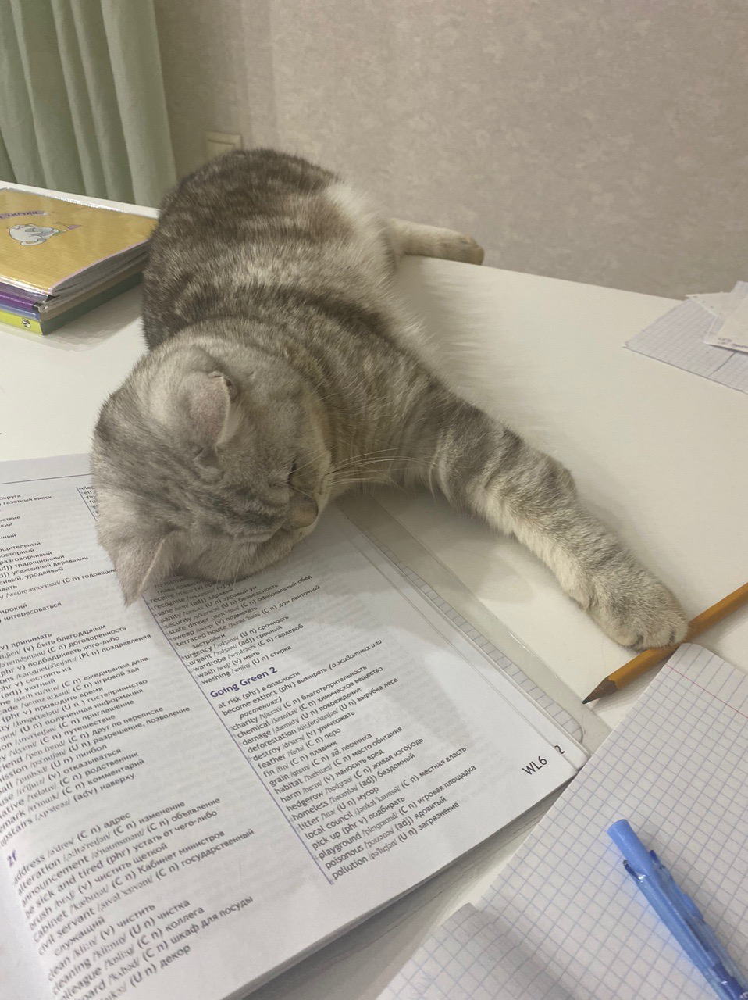

In [7]:
tr = transforms.ToTensor()
img = Image.open(content_path)
img
# это я во время выполнения этой домашки

# Part 1 - fast style transfer

### Helpful functions

In [0]:
def gram_matrix(y): # returns matrix of cross products on layer y, divided by (height*weight*#channels)
    (batch, chanel, hight, wight) = y.size()
    features = y.view(batch, chanel, wight * hight)
    features_t = features.transpose(1, 2)
    cross = features.bmm(features_t) / (chanel * hight * wight)
    return cross
  
  
def normalize_batch(batch):
    # normalization before input to VGG, using imagenet mean and std. Input should be inside [0,1] interval.
    mean = batch.new_tensor([0.485, 0.456, 0.406]).view(1,-1, 1, 1)  # new tensor with the same dtyp`e and device as batch
    std = batch.new_tensor([0.229, 0.224, 0.225]).view(1,-1, 1, 1)   # .view(1,-1, 1, 1) makes [1,3,1,1] shape of tensor
    return (batch - mean) / std

class Vgg16(torch.nn.Module):
  def __init__(self, requires_grad=False):
      super(Vgg16, self).__init__()
      vgg_pretrained_features = models.vgg16(pretrained=True).features
      self.slice1 = torch.nn.Sequential()
      self.slice2 = torch.nn.Sequential()
      self.slice3 = torch.nn.Sequential()
      self.slice4 = torch.nn.Sequential()
      for x in range(4):
          self.slice1.add_module(str(x), vgg_pretrained_features[x])
      for x in range(4, 9):
          self.slice2.add_module(str(x), vgg_pretrained_features[x])
      for x in range(9, 16):
          self.slice3.add_module(str(x), vgg_pretrained_features[x])
      for x in range(16, 23):
          self.slice4.add_module(str(x), vgg_pretrained_features[x])
      if not requires_grad:
          for param in self.parameters():
              param.requires_grad = False

  def forward(self, X):
      h = self.slice1(X)
      h_relu1_2 = h
      h = self.slice2(h)
      h_relu2_2 = h
      h = self.slice3(h)
      h_relu3_3 = h
      h = self.slice4(h)
      h_relu4_3 = h
      vgg_outputs = namedtuple("VggOutputs", ['relu1_2', 'relu2_2', 'relu3_3', 'relu4_3'])
      out = vgg_outputs(h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3)
      return ouе

### Vgg16

### StylizerNet

<img src="real-time-ST.gif">

# реализуем все элементарные блоки

In [0]:
class conv_block(torch.nn.Module):
    def __init__(self,in_channels,out_channels,kernel_size,stride):
        super(conv_block, self).__init__()
        self.conv = nn.Conv2d(in_channels , out_channels , kernel_size , stride=stride,
                                  padding=kernel_size//2 , padding_mode='reflect')
        self.inst_norm = nn.InstanceNorm2d(num_features=out_channels , affine=True)
        self.relu = nn.ReLU()
    def forward(self,x):
        x = self.conv(x)
        x = self.inst_norm(x)
        return self.relu(x)
    
    
class res_block(torch.nn.Module):
    def __init__(self,n_channels):
        super(res_block, self).__init__()
        self.conv1 = nn.Conv2d(n_channels , n_channels , kernel_size=3 , padding=1)
        self.inst_norm1 = nn.InstanceNorm2d(num_features=n_channels , affine=True)
        self.relu = nn.ReLU()
        self.inst_norm2 = nn.InstanceNorm2d(num_features=n_channels , affine=True)
        self.conv2 = nn.Conv2d(n_channels , n_channels,kernel_size=3 , padding=1)
    def forward(self,x):
        x_new = self.conv1(x)
        x_new = self.inst_norm1(x_new)
        x_new = self.relu(x_new)
        x_new = self.conv2(x_new)
        x_new = self.inst_norm2(x_new)
        return x1 + x 
    
    
class up_block(torch.nn.Module):
    def __init__(self,in_channels,out_channels,kernel_size,factor):
        super(up_block, self).__init__()
        self.upsample = nn.Upsample(scale_factor=factor , mode='nearest')
        self.conv = nn.Conv2d(in_channels , out_channels , kernel_size , 
                              stride=1,padding=kernel_size//2, padding_mode='reflect')
    def forward(self,x):
        return self.conv(self.upsample(x))
    

class post_block(torch.nn.Module):
    def __init__(self,n_channels):
        super(post_block, self).__init__()
        self.inst_norm = nn.InstanceNorm2d(num_features=n_channels,affine=True)
        self.relu = nn.ReLU()
    def forward(self,x):
        return self.relu(self.inst_norm(x))

In [0]:
class TransformerNet(torch.nn.Module):
    def __init__(self):
        super(TransformerNet, self).__init__()
        self.conv_block1 = conv_block(3,32,9,1)
        self.conv_block2 = conv_block(32,64,3,2)
        self.conv_block3 = conv_block(64,128,3,2)
        
        self.res_block1 = res_block(128)
        self.res_block2 = res_block(128)
        self.res_block3 = res_block(128)
        self.res_block4 = res_block(128)
        self.res_block5 = res_block(128)
        
        self.up_block1 = up_block(128,64,3,2)
        self.post_block1 = post_block(64)
        
        self.up_block2 = up_block(64,32,3,2)
        self.post_block2 = post_block(32)
        
        self.up_block3 = up_block(32,3,3,1)
        
        
        
        
    def forward(self,x):
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)

        x = self.res_block1(x)
        x = self.res_block2(x)
        x = self.res_block3(x)
        x = self.res_block4(x)
        x = self.res_block5(x)

        x = self.up_block1(x)
        x = self.post_block1(x)
        x = self.up_block2(x)
        x = self.post_block2(x)
        x = self.up_block3(x)
        x =  torch.clamp(x , 0 , 1) #мне посоветовали я и сделал это чтобы не было ярких цветов (0< x <1).
        return x

      
class StylizerNet(torch.nn.Module):
    def __init__(self,transformer,loss_net):
      super(StylizerNet, self).__init__()
      self.tarnsformer = transformer
      self.loss_net = loss_net

    #я написал все в тансформере но если вам удобнее оставлю наследование сталайзером просто на картинке все трнаформер я так и седелал

### Training procedure

In [0]:
  def train(stylizer,num_epoch,lr,train_path,batch_size,style_img):
    '''Training: refer to lectures for details
    loss function - sum of the 3 losses below: 
    content loss - default mse_loss between relu3_3 representations of vgg class above
    style loss - (sum of default mse_losses)*100000, mse_losses measure deviations of 
                 gramm matrices from their target values
                 for all output representations of vgg class above
    total variation loss: 0.00001*(mean of squared differeces between each pixel and its neighbour from the right+
                                   mean of squared differeces between each pixel and its neighbour from below).
    Content images taken from MS COCO valiadation 2017 dataset: http://cocodataset.org/#download
    You need to train on 60000 images (12 epochs). Each content image should be resized & cropped to 256x256 size. Style size should be original.
    Algorithm-Adam with lr=0.001. Use minibatch learning for speed.
    This is a simplified version of training from https://arxiv.org/pdf/1603.08155.pdf.
    '''
    pass
    #я не могу нормально писть через функцию так как не особо хочу мучаться с загрузкой состояния сети 
    # да и ее стопонуть нормально нельзя просто цикл мой друг


In [0]:
#!kill 0  #всего лишь способ отчистить память видеокарты

In [0]:
# гиперпараметры
num_epoch=10
lr=0.001
batch_size=12 # больше на колаб не поместилось


In [18]:

transform = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.ToTensor()

])
train_dataset = datasets.ImageFolder(train_path , transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size)

transformer = TransformerNet()
VGG_16 = Vgg16(requires_grad=False).to(device)
transformer.load_state_dict(torch.load("/content/gdrive/My Drive/style_transfer/save/style_net_e-0batch400_second_try.pwf")) #Выгружаем состояние сети
transformer = transformer.to(device)

optimizer = Adam(transformer.parameters(), lr)
mse = torch.nn.MSELoss().to(device)


style_transform = transforms.ToTensor(),
style = transforms.ToTensor()(Image.open(style_path))
style = style[:3]                                    # убираем лишний канал я не знаю для чего он но он весь в еденичках (может яркость)
style = style.repeat(batch_size, 1, 1, 1).to(device) #дублируем стиль до размеров батча

style_error = VGG_16(normalize_batch(style))
gram_batch = [gram_matrix(x) for x in style_error]

for e in range(num_epoch):
    transformer.train()
 
    for batch_id, x in enumerate(train_loader):

        style_loss = 0.
        content_loss =0.
        total_variation_loss= 0.
        
        
        optimizer.zero_grad()
        x = x[0].to(device)
        trans = transformer(x)
        
        # total_variation_loss  на самом деле не понятно зачем он нужен когда он срузу почти нулевой, возможно это из-за стиля
        total_variation_loss = mse(trans[:,:,:,:-1],trans[:,:,:,1:]) + mse(trans[:,:,:-1,:],trans[:,:,1:,:])
        total_variation_loss = total_variation_loss * 0.0001
        
        # content_loss
        trans = normalize_batch(trans)
        x =     normalize_batch(x)
        features_tr  = Vgg_16(trans)
        features_x   = Vgg_16(x)
        content_loss = mse(features_tr.relu3_3, features_x.relu3_3)

        #style_loss
        for feat_trans, gm_w in zip(features_tr, gram_batch):
            feat_tr = gram_matrix(feat_trans)
            style_loss = style_loss + mse(feat_tr, gm_w[:batch_size, :, :])    
        style_loss = style_loss * 100000
        
        
        
        
        total_loss = content_loss + style_loss + total_variation_loss
        if (batch_id % 50 == 0):
          print("loss on batch {}: [t_v_l]{} + [c_l]{} + [s_l]{} = {}".format(batch_id,round(total_variation_loss.item(), 5) ,
                                                                      round(content_loss.item(),5) ,round(style_loss.item(),5) , round(total_loss.item() , 5)))
          torch.save(transformer.state_dict(), "/content/gdrive/My Drive/style_transfer/save/style_net_e-{}batch{}_second_try.pwf".format(e , batch_id))
        total_loss.backward()
        optimizer.step()


loss on batch 0: [t_v_l]0.0 + [c_l]14.69532 + [s_l]6.07372 = 20.76904


KeyboardInterrupt: ignored

# Part 2 - depth-aware fast style transfer

Augment Gatys loss with depth loss like in [Liu et al. 2017](https://users.cs.cf.ac.uk/Yukun.Lai/papers/depth_style_transfer.pdf)
    * you may use any existing pytorch monocular depth estimation network and train it until convergence or use 
    pretrained weights (give link to model/weights if you used public model/weights)

### Train your model

## дальше воспользуемся тем же трюком: прикрутим сеть, прибавим ошибку сети к общему лоссу и проведем обучение 

In [14]:
!git clone https://github.com/OniroAI/MonoDepth-PyTorch.git
%cd MonoDepth-PyTorch

fatal: destination path 'MonoDepth-PyTorch' already exists and is not an empty directory.
/content/MonoDepth-PyTorch


In [0]:
from main_monodepth_pytorch import Model
from models_resnet import Resnet18_md
from easydict import EasyDict as edict


depth = Resnet18_md(3).to(device) # 3 = RGB 
depth.load_state_dict(torch.load("/content/gdrive/My Drive/style_transfer/monodepth_resnet18_001.pth"))
for param in depth.parameters():
  param.requires_grad = False

In [0]:
num_epoch=10
lr=0.001
batch_size=12

In [41]:
transform = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.ToTensor()

])

train_dataset = datasets.ImageFolder(train_path , transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size)


transformer_2 = TransformerNet()
VGG_16 = Vgg16(requires_grad=False).to(device)

transformer_2.load_state_dict(torch.load("/content/gdrive/My Drive/style_transfer/save/style_net_2_e-0batch400_second_try.pwf")) #Выгружаем состояние сети
transformer_2 = transformer_2.to(device)

optimizer = Adam(transformer_2.parameters(), lr)
mse = torch.nn.MSELoss().to(device)


style_transform = transforms.ToTensor(),
style = transforms.ToTensor()(Image.open(style_path))
style = style[:3]                                    # убираем лишний канал я не знаю для чего он но он весь в еденичках (может яркость)
style = style.repeat(batch_size, 1, 1, 1).to(device) #дублируем стиль до размеров батча

style_error = VGG_16(normalize_batch(style))
gram_batch = [gram_matrix(x) for x in style_error]

for e in range(num_epoch):
    transformer_2.train()
    count = 0
    
    for batch_id, x in enumerate(train_loader):

        style_loss = 0.
        content_loss =0.
        total_variation_loss= 0.
        
        
        optimizer.zero_grad()
        x = x[0].to(device)
        trans = transformer_2(x)
        
        # total_variation_loss  на самом деле не понятно зачем он нужен когда он срузу почти нулевой, возможно это из-за стиля
        total_variation_loss = mse(trans[:,:,:,:-1],trans[:,:,:,1:]) + mse(trans[:,:,:-1,:],trans[:,:,1:,:])
        total_variation_loss = total_variation_loss * 0.0001
        
        # content_loss
        trans = normalize_batch(trans)
        x =     normalize_batch(x)
        features_tr  = Vgg_16(trans)
        features_x   = Vgg_16(x)
        content_loss = mse(features_tr.relu3_3, features_x.relu3_3)

        #style_loss
        for feat_trans, gm_w in zip(features_tr, gram_batch):
            feat_tr = gram_matrix(feat_trans)
            style_loss = style_loss + mse(feat_tr, gm_w[:batch_size, :, :])    
        style_loss = style_loss * 100000
        
        # depth_loss
        """мы предпологаем что наша сеть перкрасно определяет глубину, поэтому мы просто мерим разницу значений и стараемся чтобы наша сеть-transformer
           научилась не изменять это расстояние поэтому мы осознанно выключили обучение параметров у сети-depth так как иначе она бы тоже пыталась обучиться 
           а этого мы совсем не хотим , поэтому у VGG_16 мы тоже отключили обучение"""
        x_depth = depth(x)[0][:,0,:,:].unsqueeze(1)
        trans_depth = depth(trans)[0][:,0,:,:].unsqueeze(1)
        depth_loss = mse(x_depth,trans_depth)* 100 
        
        
        total_loss = content_loss + style_loss + total_variation_loss + depth_loss
        if (batch_id % 50 == 0):
          print("loss on batch {}: [t_v_l]{} + [c_l]{} + [s_l]{} + [d_l]{} = {}".format(batch_id,     round(total_variation_loss.item(), 5) ,
                                                                                  round(content_loss.item(),5) ,round(style_loss.item(), 5) ,
                                                                                  round(depth_loss.item(),5)  , round(total_loss.item(), 5) ))
          torch.save(transformer_2.state_dict(), "/content/gdrive/My Drive/style_transfer/save/style_net_2_e-{}batch{}_second_try.pwf".format(e , batch_id))
        total_loss.backward()
        optimizer.step()


FileNotFoundError: ignored

# Demo part

Visualize selected style image and a grid of 6x3 images I(i,j).
* I(i,1) is content number i from images/contents
* I(i,2) is stylization using depth unaware style transfer
* I(i,3) is stylization using depth aware style transfer

This is the most important part of your homework. Make sure you get 
stylizations of good quality in a convinient to view resolution.

In [0]:
def plot_pictures(img_path,model):
  
    transform = transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor()
        
    ])
    img = Image.open(img_path)
    img = transforms.ToTensor()(img)
    trans = model(img.unsqueeze(0).to(device))
    tr_img = transforms.ToPILImage()(img[0].cpu().detach())
    plt.figure(figsize=(10,10))
    #plt.imshow(img)
    plt.imshow(tr_img)
    plt.imshow()
    plt.show()

In [83]:
transformer_2 = TransformerNet().to(device)
transformer_2.load_state_dict(torch.load("/content/gdrive/My Drive/style_transfer/save/style_net_e-9batch400.pwf"))
#plot_pictures(content_path, transformer)

<All keys matched successfully>

In [74]:
torch.cuda.clear_cache()

AttributeError: ignored

In [75]:
!nvidia-smi

Tue Oct 22 19:02:09 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 430.40       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P0    60W / 149W |   3985MiB / 11441MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

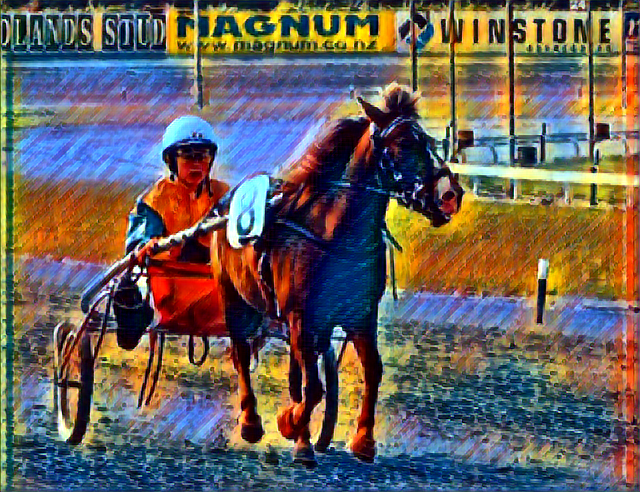

In [91]:
content_path ='/content/gdrive/My Drive/style_transfer/images/contents/000000029187.jpg'
img1 = Image.open(content_path)
img1tr1 =     transforms.ToTensor()(img1)
img1tr1 =             transformer_2(img1tr1.unsqueeze(0).to(device))
img1tr1 =   transforms.ToPILImage()(img1tr1[0].cpu().detach())
img1tr1 

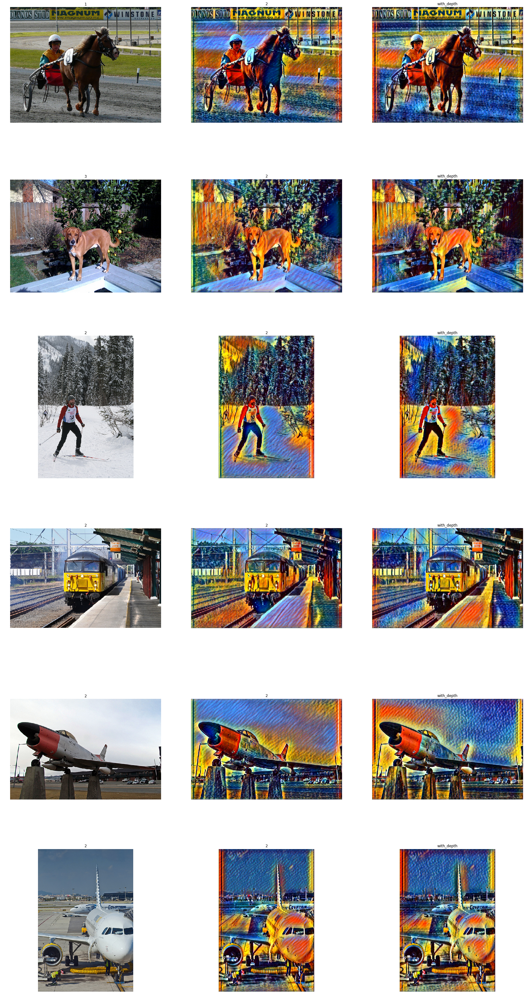

In [93]:
import numpy as np
import matplotlib.pyplot as plt


fig=plt.figure(figsize=(30, 60))
columns = 3
rows = 6


fig.add_subplot(rows, columns, 1)
axis("off")
plt.title(1)
plt.imshow(img1)


fig.add_subplot(rows, columns, 2)
plt.title(2)
axis("off")
plt.imshow(img1tr1)



fig.add_subplot(rows, columns, 3)
plt.title("with_depth")
axis("off")
plt.imshow(img1tr2)


fig.add_subplot(rows, columns, 4)
plt.title(3)
axis("off")
plt.imshow(img2)

fig.add_subplot(rows, columns, 5)
plt.title(2)
axis("off")
plt.imshow(img2tr1)

fig.add_subplot(rows, columns, 6)
plt.title("with_depth")
axis("off")
plt.imshow(img2tr2)

fig.add_subplot(rows, columns, 7)
plt.title(2)
axis("off")
plt.imshow(img3)

fig.add_subplot(rows, columns, 8)
plt.title(2)
axis("off")
plt.imshow(img3tr1)

fig.add_subplot(rows, columns, 9)
plt.title("with_depth")
axis("off")
plt.imshow(img3tr2)

fig.add_subplot(rows, columns, 10)
plt.title(2)
axis("off")
plt.imshow(img4)

fig.add_subplot(rows, columns, 11)
plt.title(2)
axis("off")
plt.imshow(img4tr1)

fig.add_subplot(rows, columns, 12)
plt.title("with_depth")
axis("off")
plt.imshow(img4tr2)

fig.add_subplot(rows, columns, 13)
plt.title(2)
axis("off")
plt.imshow(img5)

fig.add_subplot(rows, columns, 14)
plt.title(2)
axis("off")
plt.imshow(img5tr1)

fig.add_subplot(rows, columns, 15)
plt.title("with_depth")
axis("off")
plt.imshow(img5tr2)

fig.add_subplot(rows, columns, 16)
plt.title(2)
axis("off")
plt.imshow(img6)

fig.add_subplot(rows, columns, 17)
plt.title(2)
axis("off")
plt.imshow(img6tr1)

fig.add_subplot(rows, columns, 18)
plt.title("with_depth")
axis("off")
plt.imshow(img6tr2)


plt.show()

In [0]:
img = transforms.ToTensor()(img)

In [35]:
#style_img = transformer(img.unsqueeze(0).to(device))
style_img = transformer(img.unsqueeze(0).to(device))

RuntimeError: ignored

In [0]:
clp_img =  torch.clamp(style_img , 0 , 1)

In [0]:
#psr = transforms.ToPILImage()(clp_img[0].cpu().detach())
psr_2 = transforms.ToPILImage()(style_img[0].cpu().detach())

In [0]:
psr_2

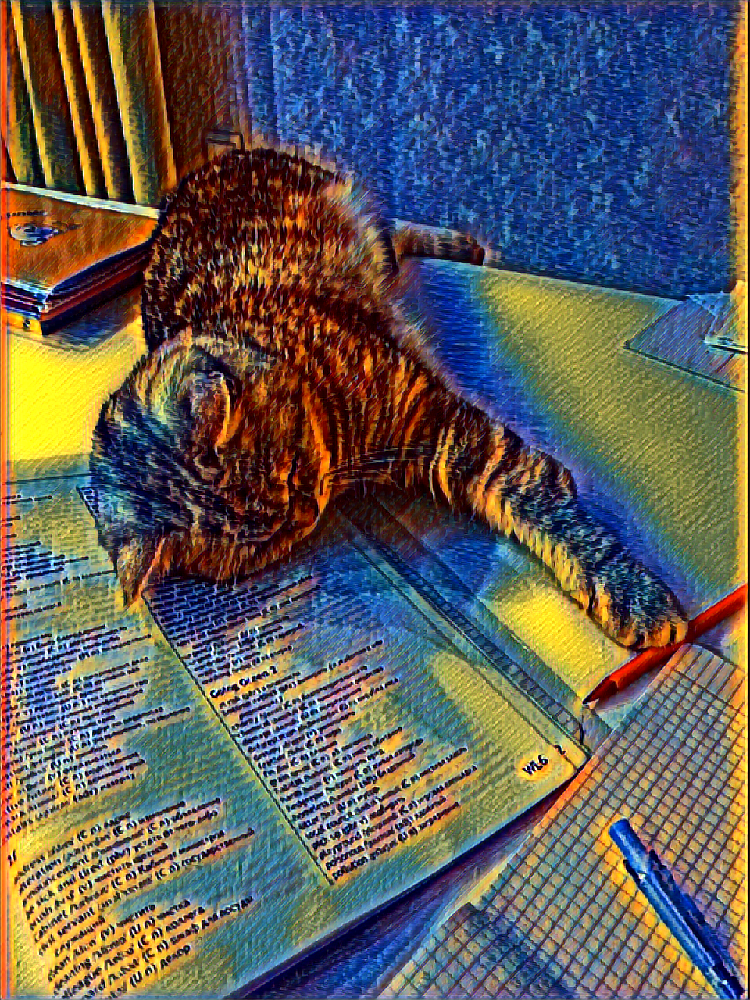

In [42]:
psr # удивительно но эта картинка была получена без карты глубины, интересно сравнить с тем что будет с картой

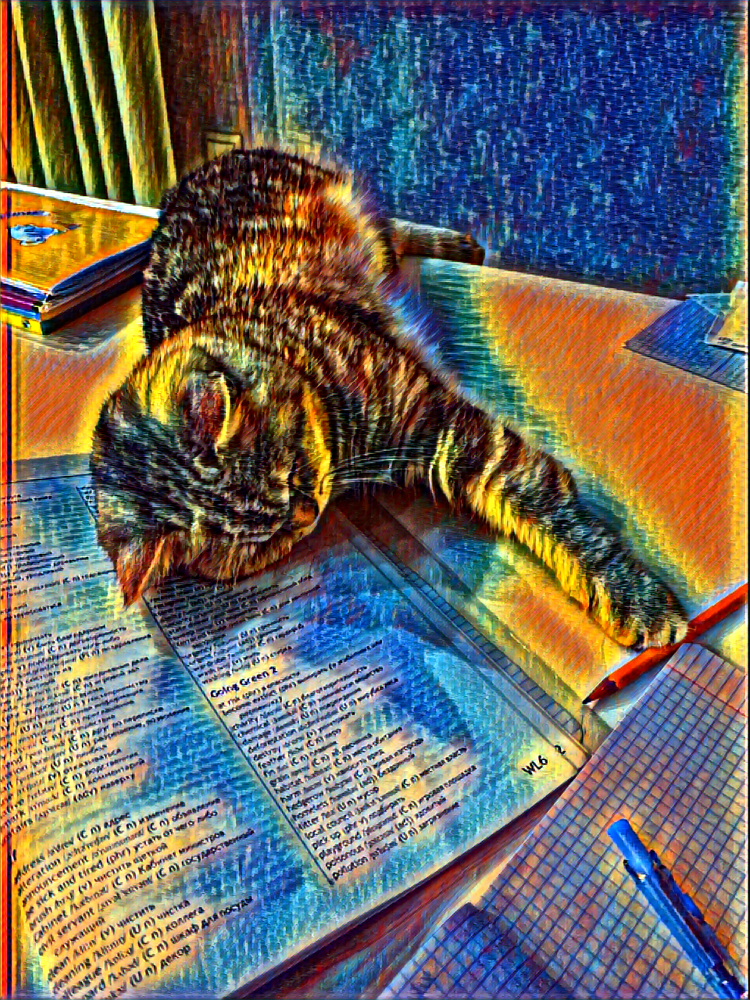

In [33]:
psr_2

In [0]:
psr.save("/content/gdrive/My Drive/style_transfer/checkpoint/cot.jpg")

# Optional part
any your ideas (you may write in Russian) on style transfer (any of the models we studied) improvement.

на последних двух картинках можно заметить что ручка которая на переднем плане просто немного изменила цвет но не текстуру а это значит что объектам которые находятся близко (согласно нашему алгоритму глубины) мы очень сторго запрещаем меняться. Это и хорошо и плохо 

все больше я не знаю что сказать все было сказано на лекции 

спасибо